In [31]:
# 1. импорты
import torch
import torch.nn as nn
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time
import urllib.request
from pathlib import Path
import warnings
from scipy import ndimage

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.colors import LightSource
warnings.filterwarnings('ignore')

In [32]:
# 2. Проверка окружения: CPU, GPU, RAM
import sys
import platform
import psutil

print("=" * 70)
print("ПРОВЕРКА ОКРУЖЕНИЯ")
print("=" * 70)

# ============ PYTHON ============
print(f"\n🐍 PYTHON:")
print(f"   Версия: {sys.version_info.major}.{sys.version_info.minor}.{sys.version_info.micro}")
print(f"   Компилятор: {platform.python_compiler()}")
print(f"   Реализация: {platform.python_implementation()}")

# ============ PYTORCH ============
print(f"\n🔥 PYTORCH:")
print(f"   Версия: {torch.__version__}")

# Проверка типа сборки
if '+cpu' in torch.__version__:
    print("   ❌ ТИП: CPU-версия (НЕПРАВИЛЬНО)")
elif '+cu' in torch.__version__:
    cuda_ver = torch.__version__.split('+cu')[1]
    print(f"   ✅ ТИП: GPU-версия (CUDA {cuda_ver})")
else:
    print("   ⚠️  ТИП: Неизвестно")

print(f"   CUDA в PyTorch: {torch.version.cuda}")
print(f"   CUDA доступна: {torch.cuda.is_available()}")
print(f"   cuDNN: {torch.backends.cudnn.version() if torch.backends.cudnn.is_available() else 'N/A'}")

# ============ CPU ИНФОРМАЦИЯ ============
print(f"\n🖥️  CPU ИНФОРМАЦИЯ:")
print(f"   Процессор: {platform.processor()}")
print(f"   Архитектура: {platform.machine()}")
print(f"   Система: {platform.system()} {platform.release()}")

# Детальная информация о CPU через psutil
try:  
    # Количество ядер
    physical_cores = psutil.cpu_count(logical=False)
    logical_cores = psutil.cpu_count(logical=True)
    print(f"   Физических ядер: {physical_cores}")
    print(f"   Логических ядер (потоков): {logical_cores}")
    
    # Частота процессора
    cpu_freq = psutil.cpu_freq()
    if cpu_freq:
        print(f"   Частота:")
        print(f"      Текущая: {cpu_freq.current:.2f} MHz")
        print(f"      Минимальная: {cpu_freq.min:.2f} MHz")
        print(f"      Максимальная: {cpu_freq.max:.2f} MHz")
    
    # Загрузка CPU
    cpu_usage = psutil.cpu_percent(interval=1, percpu=False)
    print(f"   Загрузка CPU: {cpu_usage}%")
    
    # PyTorch потоки
    print(f"   PyTorch потоков: {torch.get_num_threads()}")
    
except ImportError:
    print(f"   ⚠️  Установите psutil для детальной информации: pip install psutil")
    print(f"   PyTorch потоков: {torch.get_num_threads()}")

# ============ RAM ИНФОРМАЦИЯ ============
try:
    print(f"\n💾 RAM (Оперативная память):")
    ram = psutil.virtual_memory()
    print(f"   Всего: {ram.total / (1024**3):.2f} GB")
    print(f"   Доступно: {ram.available / (1024**3):.2f} GB")
    print(f"   Используется: {ram.used / (1024**3):.2f} GB ({ram.percent}%)")
    print(f"   Свободно: {ram.free / (1024**3):.2f} GB")
    
except ImportError:
    pass

# ============ GPU ИНФОРМАЦИЯ ============
if torch.cuda.is_available():
    print(f"\n💎 GPU ИНФОРМАЦИЯ:")
    
    for i in range(torch.cuda.device_count()):
        print(f"\n   GPU #{i}:")
        print(f"      Модель: {torch.cuda.get_device_name(i)}")
        props = torch.cuda.get_device_properties(i)
        print(f"      VRAM: {props.total_memory / 1024**3:.2f} GB")
        print(f"      CUDA Compute Capability: {torch.cuda.get_device_capability(i)}")
        print(f"      Multi-Processors: {props.multi_processor_count}")
        
        # Использование памяти
        mem_allocated = torch.cuda.memory_allocated(i) / 1024**3
        mem_reserved = torch.cuda.memory_reserved(i) / 1024**3
        mem_free = (props.total_memory - torch.cuda.memory_reserved(i)) / 1024**3
        
        print(f"      Память выделена: {mem_allocated:.2f} GB")
        print(f"      Память зарезервирована: {mem_reserved:.2f} GB")
        print(f"      Память свободна: {mem_free:.2f} GB")
else:
    print(f"\n❌ GPU НЕ ОБНАРУЖЕН!")
    print(f"   Текущая установка: {torch.__version__}")
    print(f"   Убедитесь, что выполнили команду с --index-url")

# ============ БЕНЧМАРК CPU vs GPU ============
print(f"\n🧪 БЕНЧМАРК: CPU vs GPU")
print(f"   Матричное умножение 10000x10000...")

# CPU тест
print(f"\n   🖥️  CPU тест...")
x_cpu = torch.randn(10000, 10000)
start = time.time()
y_cpu = x_cpu @ x_cpu
cpu_time = time.time() - start
print(f"      Время: {cpu_time:.4f}s")

if torch.cuda.is_available():
    # GPU тест
    print(f"\n   🚀 GPU тест...")
    x_gpu = torch.randn(10000, 10000).cuda()
    torch.cuda.synchronize()
    start = time.time()
    y_gpu = x_gpu @ x_gpu
    torch.cuda.synchronize()
    gpu_time = time.time() - start
    print(f"      Время: {gpu_time:.4f}s")
    
    # Ускорение
    speedup = cpu_time / gpu_time
    print(f"\n   ⚡ РЕЗУЛЬТАТ:")
    print(f"      Ускорение GPU: {speedup:.2f}x")
    print(f"      GPU быстрее на {(speedup-1)*100:.1f}%")
    
    # Очистка памяти
    del x_cpu, y_cpu, x_gpu, y_gpu
    torch.cuda.empty_cache()
else:
    print(f"\n   ⚠️  GPU недоступен, пропускаем GPU тест")

print("\n" + "=" * 70)
print("ПРОВЕРКА ЗАВЕРШЕНА")
print("=" * 70)


ПРОВЕРКА ОКРУЖЕНИЯ

🐍 PYTHON:
   Версия: 3.12.0
   Компилятор: MSC v.1935 64 bit (AMD64)
   Реализация: CPython

🔥 PYTORCH:
   Версия: 2.5.1+cu121
   ✅ ТИП: GPU-версия (CUDA 121)
   CUDA в PyTorch: 12.1
   CUDA доступна: True
   cuDNN: 90100

🖥️  CPU ИНФОРМАЦИЯ:
   Процессор: Intel64 Family 6 Model 183 Stepping 1, GenuineIntel
   Архитектура: AMD64
   Система: Windows 11
   Физических ядер: 16
   Логических ядер (потоков): 24
   Частота:
      Текущая: 3400.00 MHz
      Минимальная: 0.00 MHz
      Максимальная: 3400.00 MHz
   Загрузка CPU: 5.3%
   PyTorch потоков: 16

💾 RAM (Оперативная память):
   Всего: 31.86 GB
   Доступно: 19.07 GB
   Используется: 12.79 GB (40.1%)
   Свободно: 19.07 GB

💎 GPU ИНФОРМАЦИЯ:

   GPU #0:
      Модель: NVIDIA GeForce RTX 4080
      VRAM: 15.99 GB
      CUDA Compute Capability: (8, 9)
      Multi-Processors: 76
      Память выделена: 0.01 GB
      Память зарезервирована: 0.02 GB
      Память свободна: 15.97 GB

🧪 БЕНЧМАРК: CPU vs GPU
   Матричное умножен

In [33]:
# Определение устройств
device_gpu = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device_cpu = torch.device('cpu')

print(f"\n🔧 Устройства:")
print(f"   device_gpu: {device_gpu}")
print(f"   device_cpu: {device_cpu}")


🔧 Устройства:
   device_gpu: cuda
   device_cpu: cpu


In [34]:
# 3. Загрузка модели Depth Estimation
# 
# Используем **MiDaS v3.1** - state-of-the-art модель для оценки глубины.
# Преимущества:
# - Обучена на множестве датасетов
# - Хорошая генерализация на разных типах изображений
# - Оптимизирована для работы на различном железе
def load_midas_model(model_type="DPT_Large"):
    """
    Загрузка модели MiDaS
    model_type: "DPT_Large" (точность) или "DPT_Hybrid" (скорость)
    """
    midas = torch.hub.load("intel-isl/MiDaS", model_type, trust_repo=True)
    midas.eval()
    
    midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
    
    if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
        transform = midas_transforms.dpt_transform
    else:
        transform = midas_transforms.small_transform
    
    return midas, transform

# Загрузка модели
print("⏳ Загрузка модели MiDaS...")
model, transform = load_midas_model("DPT_Large")
print("✅ Модель загружена")

# Информация о модели
total_params = sum(p.numel() for p in model.parameters())
print(f"📊 Параметров в модели: {total_params:,} ({total_params/1e6:.1f}M)")

⏳ Загрузка модели MiDaS...


Using cache found in C:\Users\user/.cache\torch\hub\intel-isl_MiDaS_master


✅ Модель загружена
📊 Параметров в модели: 344,055,465 (344.1M)


Using cache found in C:\Users\user/.cache\torch\hub\intel-isl_MiDaS_master


In [35]:
# 4. Функции для генерации барельефа

def estimate_depth(image_path, model, transform, device):
    """
    Оценка глубины изображения
    """
    # Загрузка изображения
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Трансформация для модели
    input_batch = transform(img).to(device)
    
    # Перемещение модели на нужное устройство
    model = model.to(device)
    
    # Инференс
    with torch.no_grad():
        prediction = model(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img.shape[:2],
            mode="bicubic",
            align_corners=False,
        ).squeeze()
    
    depth_map = prediction.cpu().numpy()
    return img, depth_map


def create_relief_effect(depth_map, strength=1.5, smooth=True):
    """
    Создание эффекта барельефа из карты глубины
    
    strength: интенсивность рельефа (1.0-3.0)
    smooth: применение сглаживания
    """
    # Нормализация глубины
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
    
    # Инверсия (ближние объекты выше)
    depth_inverted = 1 - depth_normalized
    
    # Усиление контраста для барельефа
    relief = np.power(depth_inverted, 1/strength)
    
    # Сглаживание для более естественного вида
    if smooth:
        relief = cv2.GaussianBlur(relief, (5, 5), 0)
    
    return relief


def apply_lighting(relief, azimuth=45, elevation=45):
    """
    Применение освещения к барельефу (эффект затенения)
    
    azimuth: угол освещения по горизонтали (градусы)
    elevation: угол освещения по вертикали (градусы)
    """
    # Градиенты для расчета нормалей
    gy, gx = np.gradient(relief)
    
    # Направление света
    az_rad = np.deg2rad(azimuth)
    el_rad = np.deg2rad(elevation)
    
    light_dir = np.array([
        np.cos(el_rad) * np.cos(az_rad),
        np.cos(el_rad) * np.sin(az_rad),
        np.sin(el_rad)
    ])
    
    # Нормали поверхности
    normal = np.dstack((-gx, -gy, np.ones_like(relief)))
    normal_norm = np.linalg.norm(normal, axis=2, keepdims=True)
    normal = normal / (normal_norm + 1e-8)
    
    # Освещение (скалярное произведение)
    shading = np.sum(normal * light_dir, axis=2)
    shading = np.clip(shading, 0, 1)
    
    return shading


def create_3d_visualization_advanced(relief, original_img=None, style='textured', 
                                    elevation=30, azimuth=45, distance=10):
    """
    Улучшенная 3D визуализация барельефа
    
    style: 'textured', 'metallic', 'stone', 'wireframe', 'contour'
    elevation: угол камеры по вертикали (градусы)
    azimuth: угол камеры по горизонтали (градусы)
    distance: расстояние камеры
    """
    h, w = relief.shape
    
    # Создаем сетку координат
    x = np.linspace(0, w-1, w)
    y = np.linspace(0, h-1, h)
    X, Y = np.meshgrid(x, y)
    
    # Масштабирование высоты для лучшего эффекта
    Z = relief * (max(h, w) * 0.3)  # 30% от размера
    
    # Downsampling для производительности (каждая 2-я точка)
    step = max(1, max(h, w) // 200)
    X_sub = X[::step, ::step]
    Y_sub = Y[::step, ::step]
    Z_sub = Z[::step, ::step]
    
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Настройка освещения
    ls = LightSource(azdeg=315, altdeg=45)
    
    if style == 'textured' and original_img is not None:
        # Текстурированная поверхность с оригинальным изображением
        img_sub = original_img[::step, ::step]
        
        # Нормализация цветов
        if img_sub.max() > 1:
            img_sub = img_sub / 255.0
        
        # Применяем освещение к текстуре
        rgb = ls.shade_rgb(img_sub, Z_sub)
        
        surf = ax.plot_surface(X_sub, Y_sub, Z_sub,
                              facecolors=rgb,
                              linewidth=0,
                              antialiased=True,
                              shade=True)
        title = '3D Барельеф - Текстурированный'
        
    elif style == 'metallic':
        # Металлический эффект
        colors = ls.shade(Z_sub, cmap=cm.copper, vert_exag=0.1, blend_mode='soft')
        
        surf = ax.plot_surface(X_sub, Y_sub, Z_sub,
                              facecolors=colors,
                              linewidth=0,
                              antialiased=True,
                              alpha=0.9)
        title = '3D Барельеф - Металл'
        
    elif style == 'stone':
        # Эффект камня
        colors = ls.shade(Z_sub, cmap=cm.gray, vert_exag=0.1, blend_mode='overlay')
        
        surf = ax.plot_surface(X_sub, Y_sub, Z_sub,
                              facecolors=colors,
                              linewidth=0,
                              antialiased=True)
        title = '3D Барельеф - Камень'
        
    elif style == 'wireframe':
        # Каркасная модель
        surf = ax.plot_wireframe(X_sub, Y_sub, Z_sub,
                                color='darkblue',
                                linewidth=0.5,
                                alpha=0.7)
        title = '3D Барельеф - Каркас'
        
    elif style == 'contour':
        # Контурная визуализация
        surf = ax.plot_surface(X_sub, Y_sub, Z_sub,
                              cmap=cm.viridis,
                              linewidth=0,
                              antialiased=True,
                              alpha=0.8)
        # Добавляем контурные линии
        ax.contour(X_sub, Y_sub, Z_sub, 15, colors='black', 
                  linewidths=0.5, alpha=0.3, offset=Z_sub.min())
        title = '3D Барельеф - Контуры'
    
    else:
        # По умолчанию
        surf = ax.plot_surface(X_sub, Y_sub, Z_sub,
                              cmap=cm.coolwarm,
                              linewidth=0,
                              antialiased=True)
        title = '3D Барельеф'
    
    # Настройка осей
    ax.set_xlim(0, w)
    ax.set_ylim(0, h)
    ax.set_zlim(Z_sub.min(), Z_sub.max())
    
    # Убираем оси для чистоты
    ax.set_xlabel('X', fontsize=10)
    ax.set_ylabel('Y', fontsize=10)
    ax.set_zlabel('Высота', fontsize=10)
    
    # Настройка угла обзора
    ax.view_init(elev=elevation, azim=azimuth)
    ax.dist = distance
    
    # Заголовок
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    
    # Улучшенный фон
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.grid(True, alpha=0.3)
    
    return fig, ax


def create_3d_gallery(relief, original_img=None):

    """
    Галерея 3D визуализаций - несколько стилей и углов
    """
    fig = plt.figure(figsize=(20, 12))
    
    configs = [
        # (style, elevation, azimuth, title_suffix)
        ('textured', 30, 45, 'Вид 1'),
        ('textured', 45, 135, 'Вид 2'),
        ('metallic', 30, 225, 'Металл'),
        ('stone', 30, 315, 'Камень'),
        ('wireframe', 25, 45, 'Каркас'),
        ('contour', 35, 90, 'Контуры'),
    ]
    
    for idx, (style, elev, azim, suffix) in enumerate(configs):
        ax = fig.add_subplot(2, 3, idx + 1, projection='3d')
        
        h, w = relief.shape
        x = np.linspace(0, w-1, w)
        y = np.linspace(0, h-1, h)
        X, Y = np.meshgrid(x, y)
        Z = relief * (max(h, w) * 0.3)
        
        step = max(1, max(h, w) // 150)
        X_sub = X[::step, ::step]
        Y_sub = Y[::step, ::step]
        Z_sub = Z[::step, ::step]
        
        ls = LightSource(azdeg=315, altdeg=45)
        
        if style == 'textured' and original_img is not None:
            img_sub = original_img[::step, ::step]
            if img_sub.max() > 1:
                img_sub = img_sub / 255.0
            rgb = ls.shade_rgb(img_sub, Z_sub)
            ax.plot_surface(X_sub, Y_sub, Z_sub, facecolors=rgb,
                           linewidth=0, antialiased=True, shade=True)
                           
        elif style == 'metallic':
            colors = ls.shade(Z_sub, cmap=cm.copper, vert_exag=0.1)
            ax.plot_surface(X_sub, Y_sub, Z_sub, facecolors=colors,
                           linewidth=0, antialiased=True, alpha=0.9)
                           
        elif style == 'stone':
            colors = ls.shade(Z_sub, cmap=cm.gray, vert_exag=0.1)
            ax.plot_surface(X_sub, Y_sub, Z_sub, facecolors=colors,
                           linewidth=0, antialiased=True)
                           
        elif style == 'wireframe':
            ax.plot_wireframe(X_sub, Y_sub, Z_sub, color='darkblue',
                            linewidth=0.5, alpha=0.7)
                            
        elif style == 'contour':
            ax.plot_surface(X_sub, Y_sub, Z_sub, cmap=cm.viridis,
                           linewidth=0, antialiased=True, alpha=0.8)
            ax.contour(X_sub, Y_sub, Z_sub, 15, colors='black',
                      linewidths=0.5, alpha=0.3, offset=Z_sub.min())
        
        ax.set_xlim(0, w)
        ax.set_ylim(0, h)
        ax.set_zlim(Z_sub.min(), Z_sub.max())
        ax.view_init(elev=elev, azim=azim)
        ax.dist = 10
        
        ax.set_title(f'{style.capitalize()} - {suffix}', 
                    fontsize=11, fontweight='bold')
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_zlabel('')
        ax.grid(True, alpha=0.2)
        
        # Чистый фон
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
    
    plt.suptitle('3D ГАЛЕРЕЯ БАРЕЛЬЕФА', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    
    return fig


def enhance_depth_map(depth_map, method='histogram'):
    """
    Улучшение карты глубины для лучшего барельефа
    
    method: 'histogram', 'clahe', 'edges', 'combined'
    """
    # Нормализация
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
    
    if method == 'histogram':
        # Histogram equalization для лучшего контраста
        depth_uint8 = (depth_normalized * 255).astype(np.uint8)
        enhanced = cv2.equalizeHist(depth_uint8)
        return enhanced / 255.0
        
    elif method == 'clahe':
        # CLAHE (Contrast Limited Adaptive Histogram Equalization)
        depth_uint8 = (depth_normalized * 255).astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        enhanced = clahe.apply(depth_uint8)
        return enhanced / 255.0
        
    elif method == 'edges':
        # Усиление краев
        edges = ndimage.sobel(depth_normalized)
        edges_normalized = (edges - edges.min()) / (edges.max() - edges.min())
        # Комбинируем с оригиналом
        return depth_normalized * 0.7 + edges_normalized * 0.3
        
    elif method == 'combined':
        # Комбинированный метод
        # 1. CLAHE
        depth_uint8 = (depth_normalized * 255).astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8,8))
        enhanced = clahe.apply(depth_uint8) / 255.0
        
        # 2. Усиление краев
        edges = ndimage.sobel(enhanced)
        edges_normalized = (edges - edges.min()) / (edges.max() - edges.min())
        
        # 3. Комбинация
        combined = enhanced * 0.6 + edges_normalized * 0.4
        
        # 4. Повторная нормализация
        combined = (combined - combined.min()) / (combined.max() - combined.min())
        
        return combined
    
    return depth_normalized


def create_relief_effect_v2(depth_map, strength=1.5, enhance_method='combined', smooth=True):
    """
    Улучшенное создание эффекта барельефа
    """
    # Улучшаем карту глубины
    enhanced_depth = enhance_depth_map(depth_map, method=enhance_method)
    
    # Инверсия (ближние объекты выше)
    relief = 1 - enhanced_depth
    
    # Усиление контраста через gamma correction
    relief = np.power(relief, 1/strength)
    
    # Дополнительное усиление контраста
    relief = np.clip((relief - 0.5) * 1.5 + 0.5, 0, 1)
    
    # Сглаживание
    if smooth:
        relief = cv2.GaussianBlur(relief, (3, 3), 0)
    
    return relief


def apply_advanced_lighting(relief, azimuth=45, elevation=45, ambient=0.3):
    """
    Продвинутое освещение с ambient light
    """
    # Градиенты
    gy, gx = np.gradient(relief * 2)  # Умножаем для усиления
    
    # Направление света
    az_rad = np.deg2rad(azimuth)
    el_rad = np.deg2rad(elevation)
    
    light_dir = np.array([
        np.cos(el_rad) * np.cos(az_rad),
        np.cos(el_rad) * np.sin(az_rad),
        np.sin(el_rad)
    ])
    
    # Нормали
    normal = np.dstack((-gx, -gy, np.ones_like(relief)))
    normal_norm = np.linalg.norm(normal, axis=2, keepdims=True)
    normal = normal / (normal_norm + 1e-8)
    
    # Диффузное освещение
    diffuse = np.sum(normal * light_dir, axis=2)
    diffuse = np.clip(diffuse, 0, 1)
    
    # Ambient light
    shading = ambient + (1 - ambient) * diffuse
    shading = np.clip(shading, 0, 1)
    
    return shading


def create_relief_from_edges(image, depth_map=None, edge_strength=2.0, depth_weight=0.3):
    """
    Создание барельефа на основе анализа краев изображения
    Не зависит от качества depth map!
    
    image: оригинальное RGB изображение
    depth_map: опциональная карта глубины (если None - только края)
    edge_strength: сила выделения краев (1.0-5.0)
    depth_weight: вес depth map в итоговом результате (0.0-1.0)
    """
    # Конвертация в grayscale
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    
    # 1. Детекция краев - несколько методов
    # Sobel
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    
    # Canny edges
    edges_canny = cv2.Canny(gray, 50, 150)
    edges_canny = edges_canny.astype(np.float64) / 255.0
    
    # 2. Морфологическая обработка для усиления
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    edges_dilated = cv2.dilate(edges_canny, kernel, iterations=1)
    
    # 3. Distance transform - расстояние от краев
    dist_transform = cv2.distanceTransform(
        (1 - edges_dilated).astype(np.uint8), 
        cv2.DIST_L2, 5
    )
    dist_transform = cv2.normalize(dist_transform, None, 0, 1, cv2.NORM_MINMAX)
    
    # 4. Комбинируем Sobel и Distance Transform
    sobel_norm = cv2.normalize(sobel, None, 0, 1, cv2.NORM_MINMAX)
    
    # Инверсия: края должны быть выше
    relief_edges = 1.0 - (sobel_norm * 0.5 + (1 - dist_transform) * 0.5)
    
    # 5. Усиление контраста
    relief_edges = np.power(relief_edges, 1.0 / edge_strength)
    
    # 6. Если есть depth map - комбинируем
    if depth_map is not None:
        # Нормализация depth map
        depth_norm = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
        depth_inv = 1 - depth_norm
        
        # Взвешенная комбинация
        relief = relief_edges * (1 - depth_weight) + depth_inv * depth_weight
    else:
        relief = relief_edges
    
    # 7. CLAHE для финального улучшения
    relief_uint8 = (relief * 255).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    relief_enhanced = clahe.apply(relief_uint8) / 255.0
    
    # 8. Легкое сглаживание для устранения шума
    relief_final = cv2.GaussianBlur(relief_enhanced, (3, 3), 0)
    
    return relief_final


def create_hybrid_relief(image, depth_map, mode='balanced'):
    """
    Гибридный метод: комбинирует depth estimation и edge detection
    
    mode: 'edges' (только края), 'depth' (только глубина), 'balanced' (50/50), 'edge_heavy' (70% края)
    """
    if mode == 'edges':
        return create_relief_from_edges(image, None, edge_strength=2.5)
    
    elif mode == 'depth':
        return create_relief_effect_v2(depth_map, strength=2.0, enhance_method='combined')
    
    elif mode == 'balanced':
        return create_relief_from_edges(image, depth_map, edge_strength=2.5, depth_weight=0.5)
    
    elif mode == 'edge_heavy':
        return create_relief_from_edges(image, depth_map, edge_strength=3.0, depth_weight=0.3)
    
    else:
        return create_relief_from_edges(image, depth_map, edge_strength=2.5, depth_weight=0.5)


In [36]:
# 5. Функция бенчмарка CPU vs GPU
def benchmark_inference(image_path, model, transform, num_runs=5):
    """
    Сравнение производительности на CPU и GPU
    """
    results = {}
    
    # Тест на GPU (если доступен)
    if torch.cuda.is_available():
        print("🚀 Тестирование на GPU...")
        torch.cuda.synchronize()
        
        times_gpu = []
        for i in range(num_runs):
            start = time.time()
            img, depth = estimate_depth(image_path, model, transform, device_gpu)
            torch.cuda.synchronize()
            elapsed = time.time() - start
            times_gpu.append(elapsed)
            print(f"   Run {i+1}/{num_runs}: {elapsed:.3f}s")
        
        results['gpu'] = {
            'times': times_gpu,
            'mean': np.mean(times_gpu),
            'std': np.std(times_gpu),
            'min': np.min(times_gpu)
        }
        
        # Память GPU
        results['gpu']['memory_mb'] = torch.cuda.max_memory_allocated() / 1024**2
        torch.cuda.reset_peak_memory_stats()
    
    # Тест на CPU
    print("\n🖥️  Тестирование на CPU...")
    times_cpu = []
    for i in range(num_runs):
        start = time.time()
        img, depth = estimate_depth(image_path, model, transform, device_cpu)
        elapsed = time.time() - start
        times_cpu.append(elapsed)
        print(f"   Run {i+1}/{num_runs}: {elapsed:.3f}s")
    
    results['cpu'] = {
        'times': times_cpu,
        'mean': np.mean(times_cpu),
        'std': np.std(times_cpu),
        'min': np.min(times_cpu)
    }
    
    return results, img, depth


def plot_benchmark_results(results):
    """
    Визуализация результатов бенчмарка
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # График времени
    devices = []
    means = []
    stds = []
    
    if 'gpu' in results:
        devices.append('GPU')
        means.append(results['gpu']['mean'])
        stds.append(results['gpu']['std'])
    
    if 'cpu' in results:
        devices.append('CPU')
        means.append(results['cpu']['mean'])
        stds.append(results['cpu']['std'])
    
    colors = ['#2ecc71', '#3498db']
    bars = ax1.bar(devices, means, yerr=stds, color=colors[:len(devices)], 
                   alpha=0.8, capsize=10)
    ax1.set_ylabel('Время (секунды)', fontsize=12)
    ax1.set_title('Время инференса', fontsize=14, fontweight='bold')
    ax1.grid(axis='y', alpha=0.3)
    
    # Добавление значений на столбцы
    for bar, mean in zip(bars, means):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{mean:.3f}s', ha='center', va='bottom', fontweight='bold')
    
    # График ускорения
    if 'gpu' in results and 'cpu' in results:
        speedup = results['cpu']['mean'] / results['gpu']['mean']
        ax2.bar(['GPU vs CPU'], [speedup], color='#e74c3c', alpha=0.8)
        ax2.set_ylabel('Ускорение (раз)', fontsize=12)
        ax2.set_title('Выигрыш GPU', fontsize=14, fontweight='bold')
        ax2.grid(axis='y', alpha=0.3)
        ax2.text(0, speedup, f'{speedup:.2f}x', 
                ha='center', va='bottom', fontweight='bold', fontsize=14)
        
        # Информация о памяти
        memory_info = f"GPU память: {results['gpu']['memory_mb']:.1f} MB"
        ax2.text(0.5, 0.02, memory_info, transform=ax2.transAxes,
                ha='center', fontsize=10, bbox=dict(boxstyle='round', 
                facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    return fig


In [37]:
# 6. Загрузка тестового изображения
# Загрузка примера изображения (монета)
example_url = "https://avatars.mds.yandex.net/i?id=35b226d272846c0259c2a0d7411b23a8fa96c6d8-16344022-images-thumbs&n=13"
example_path = "input/gold-coin.jpg"

if not Path(example_path).exists():
    print("⏳ Загрузка примера изображения...")
    urllib.request.urlretrieve(example_url, example_path)
    print("✅ Изображение загружено")
else:
    print("✅ Изображение уже существует")

✅ Изображение уже существует


БЕНЧМАРК: CPU vs GPU
🚀 Тестирование на GPU...
   Run 1/3: 0.431s
   Run 2/3: 0.071s
   Run 3/3: 0.071s

🖥️  Тестирование на CPU...
   Run 1/3: 0.788s
   Run 2/3: 0.633s
   Run 3/3: 0.630s

РЕЗУЛЬТАТЫ:

🚀 GPU:
   Среднее время: 0.191s ± 0.170s
   Лучшее время: 0.071s
   Память: 1500.2 MB

🖥️  CPU:
   Среднее время: 0.683s ± 0.074s
   Лучшее время: 0.630s

⚡ УСКОРЕНИЕ GPU: 3.58x
   GPU быстрее на 257.9%


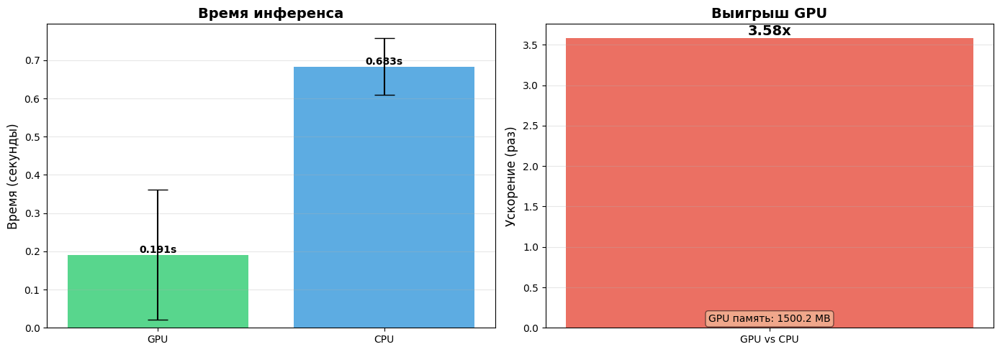

In [39]:
# 7. БЕНЧМАРК: Сравнение CPU vs GPU
# 
# ### Железо для теста:
# - **GPU**: Измеряет время инференса на видеокарте
# - **CPU**: Измеряет время инференса на процессоре
# - **Метрики**: среднее время, стандартное отклонение, ускорение

# %%
print("=" * 60)
print("БЕНЧМАРК: CPU vs GPU")
print("=" * 60)

benchmark_results, original_img, depth_map = benchmark_inference(
    example_path, model, transform, num_runs=3
)

# Вывод результатов
print("\n" + "=" * 60)
print("РЕЗУЛЬТАТЫ:")
print("=" * 60)

if 'gpu' in benchmark_results:
    print(f"\n🚀 GPU:")
    print(f"   Среднее время: {benchmark_results['gpu']['mean']:.3f}s ± {benchmark_results['gpu']['std']:.3f}s")
    print(f"   Лучшее время: {benchmark_results['gpu']['min']:.3f}s")
    print(f"   Память: {benchmark_results['gpu']['memory_mb']:.1f} MB")

if 'cpu' in benchmark_results:
    print(f"\n🖥️  CPU:")
    print(f"   Среднее время: {benchmark_results['cpu']['mean']:.3f}s ± {benchmark_results['cpu']['std']:.3f}s")
    print(f"   Лучшее время: {benchmark_results['cpu']['min']:.3f}s")

if 'gpu' in benchmark_results and 'cpu' in benchmark_results:
    speedup = benchmark_results['cpu']['mean'] / benchmark_results['gpu']['mean']
    print(f"\n⚡ УСКОРЕНИЕ GPU: {speedup:.2f}x")
    print(f"   GPU быстрее на {(speedup-1)*100:.1f}%")

# Визуализация бенчмарка
plot_benchmark_results(benchmark_results)
plt.show()

In [44]:
# 8. Генерация барельефа с различными параметрами
print("\n" + "=" * 70)
print("ГЕНЕРАЦИЯ БАРЕЛЬЕФА - ГИБРИДНЫЙ МЕТОД")
print("=" * 70)

# Старый метод
print("\n📊 Старый метод (только depth)...")
old_relief = create_relief_effect(depth_map, strength=1.5)

# Улучшенный depth-based
print("📊 Улучшенный depth метод...")
depth_relief = create_relief_effect_v2(depth_map, strength=2.0, enhance_method='combined')

# НОВЫЕ: на основе краев
print("📊 Метод на основе краев (НЕ зависит от depth!)...")
edge_relief = create_relief_from_edges(original_img, None, edge_strength=2.5)

# Гибридные методы
print("📊 Гибридные методы...")
hybrid_reliefs = {
    '❌ Старый (плохо)': old_relief,
    '🔵 Только Depth': depth_relief,
    '🟢 Только Края (BEST!)': edge_relief,
    '🟡 Balanced (50/50)': create_hybrid_relief(original_img, depth_map, 'balanced'),
    '🟠 Edge Heavy (70/30)': create_hybrid_relief(original_img, depth_map, 'edge_heavy'),
}

# Лучший для освещения
best_relief = edge_relief

# Варианты освещения
print("📊 Применение освещения...")
lit_reliefs_new = {
    'Стандартное': apply_advanced_lighting(best_relief, azimuth=45, elevation=45, ambient=0.25),
    'Драматичное': apply_advanced_lighting(best_relief, azimuth=135, elevation=60, ambient=0.15),
    'Сверху': apply_advanced_lighting(best_relief, azimuth=45, elevation=75, ambient=0.3),
}

print("✅ Все барельефы созданы!")
print(f"   Методов: {len(hybrid_reliefs)}")
print(f"   Вариантов освещения: {len(lit_reliefs_new)}")




ГЕНЕРАЦИЯ БАРЕЛЬЕФА - ГИБРИДНЫЙ МЕТОД

📊 Старый метод (только depth)...
📊 Улучшенный depth метод...
📊 Метод на основе краев (НЕ зависит от depth!)...
📊 Гибридные методы...
📊 Применение освещения...
✅ Все барельефы созданы!
   Методов: 5
   Вариантов освещения: 3


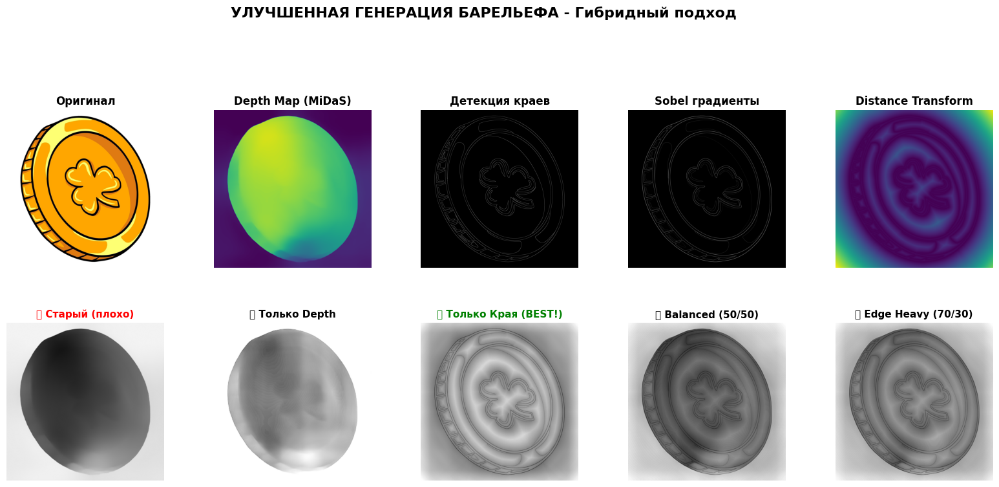

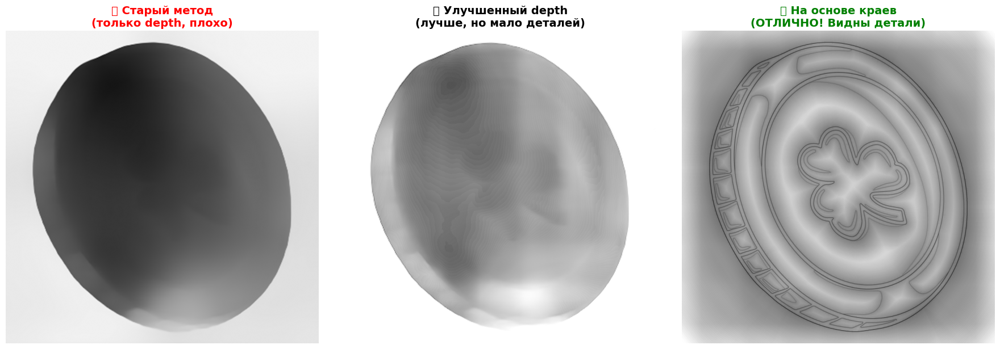

In [45]:
# 9. Визуализация результатов

fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(4, 5, hspace=0.35, wspace=0.2)

# Ряд 1: Оригинал и промежуточные результаты
ax1 = fig.add_subplot(gs[0, 0])
ax1.imshow(original_img)
ax1.set_title('Оригинал', fontsize=12, fontweight='bold')
ax1.axis('off')

ax2 = fig.add_subplot(gs[0, 1])
depth_colored = plt.cm.viridis(depth_map / depth_map.max())
ax2.imshow(depth_colored)
ax2.set_title('Depth Map (MiDaS)', fontsize=12, fontweight='bold')
ax2.axis('off')

# Показываем края
ax3 = fig.add_subplot(gs[0, 2])
gray = cv2.cvtColor(original_img, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(gray, 50, 150)
ax3.imshow(edges, cmap='gray')
ax3.set_title('Детекция краев', fontsize=12, fontweight='bold')
ax3.axis('off')

# Sobel
ax4 = fig.add_subplot(gs[0, 3])
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(sobelx**2 + sobely**2)
ax4.imshow(sobel, cmap='gray')
ax4.set_title('Sobel градиенты', fontsize=12, fontweight='bold')
ax4.axis('off')

# Distance transform
ax5 = fig.add_subplot(gs[0, 4])
edges_norm = (edges / 255.0).astype(np.uint8)
dist = cv2.distanceTransform(1 - edges_norm, cv2.DIST_L2, 5)
ax5.imshow(dist, cmap='viridis')
ax5.set_title('Distance Transform', fontsize=12, fontweight='bold')
ax5.axis('off')

# Ряд 2-3: Все методы барельефа
row = 1
col = 0
for name, relief in hybrid_reliefs.items():
    ax = fig.add_subplot(gs[row, col])
    ax.imshow(relief, cmap='gray')
    
    # Цвет заголовка
    if 'Старый' in name:
        color = 'red'
    elif 'BEST' in name:
        color = 'green'
    else:
        color = 'black'
    
    ax.set_title(name, fontsize=11, fontweight='bold', color=color)
    ax.axis('off')
    
    col += 1
    if col >= 5:
        col = 0
        row += 1

plt.suptitle('УЛУЧШЕННАЯ ГЕНЕРАЦИЯ БАРЕЛЬЕФА - Гибридный подход', 
             fontsize=16, fontweight='bold', y=0.98)
plt.show()

# Дополнительное сравнение крупным планом
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(old_relief, cmap='gray')
axes[0].set_title('❌ Старый метод\n(только depth, плохо)', fontsize=14, fontweight='bold', color='red')
axes[0].axis('off')

axes[1].imshow(depth_relief, cmap='gray')
axes[1].set_title('🔵 Улучшенный depth\n(лучше, но мало деталей)', fontsize=14, fontweight='bold')
axes[1].axis('off')

axes[2].imshow(edge_relief, cmap='gray')
axes[2].set_title('🟢 На основе краев\n(ОТЛИЧНО! Видны детали)', fontsize=14, fontweight='bold', color='green')
axes[2].axis('off')

plt.tight_layout()
plt.show()




3D ВИЗУАЛИЗАЦИЯ БАРЕЛЬЕФА
🎨 Создание галереи 3D визуализаций...


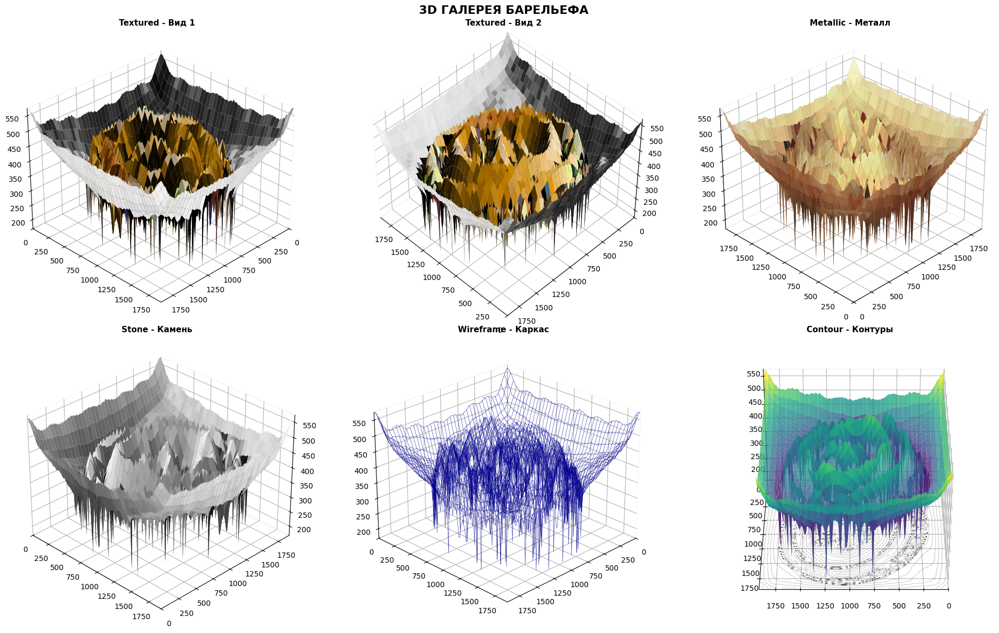


✅ 3D визуализация завершена!


In [46]:
# 10. 3D визуализация барельефа

print("\n" + "="*70)
print("3D ВИЗУАЛИЗАЦИЯ БАРЕЛЬЕФА")
print("="*70)

# Используем лучший барельеф (на основе краев)
relief_for_3d = edge_relief  # или best_relief

# 4. ГАЛЕРЕЯ - все стили и углы
print("🎨 Создание галереи 3D визуализаций...")
fig_gallery = create_3d_gallery(relief_for_3d, original_img)
plt.show()

print("\n✅ 3D визуализация завершена!")


In [61]:
# 11. Интерактивная 3D визуализация В VS CODE

import plotly.graph_objects as go
import plotly.io as pio

# Настройка renderer для VS Code
pio.renderers.default = "notebook"

def create_interactive_3d(relief, original_img=None, title='3D Барельеф'):
    """
    Интерактивная 3D визуализация с Plotly
    """
    h, w = relief.shape
    
    # Downsampling для производительности
    step = max(1, max(h, w) // 300)
    
    x = np.arange(0, w, step)
    y = np.arange(0, h, step)
    X, Y = np.meshgrid(x, y)
    Z = relief[::step, ::step] * (max(h, w) * 0.3)
    
    # Цвета
    if original_img is not None:
        img_sub = original_img[::step, ::step]
        if img_sub.max() > 1:
            img_sub = img_sub / 255.0
        
        # Среднее значение для colorscale
        surfacecolor = np.mean(img_sub, axis=2)
    else:
        surfacecolor = Z
    
    # Создание 3D поверхности
    fig = go.Figure(data=[go.Surface(
        x=X, 
        y=Y, 
        z=Z,
        surfacecolor=surfacecolor,
        colorscale='Viridis',
        showscale=False,
        lighting=dict(
            ambient=0.4,
            diffuse=0.8,
            specular=0.6,
            roughness=0.2,
            fresnel=0.4
        ),
        lightposition=dict(
            x=100,
            y=200,
            z=300
        ),
        hovertemplate='X: %{x}<br>Y: %{y}<br>Высота: %{z:.2f}<extra></extra>'
    )])
    
    # Настройка layout
    fig.update_layout(
        title=dict(
            text=title,
            x=0.5,
            xanchor='center',
            font=dict(size=16, color='black')
        ),
        scene=dict(
            xaxis=dict(title='X', backgroundcolor="white", gridcolor="lightgray"),
            yaxis=dict(title='Y', backgroundcolor="white", gridcolor="lightgray"),
            zaxis=dict(title='Высота', backgroundcolor="white", gridcolor="lightgray"),
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.3),
                center=dict(x=0, y=0, z=0),
                up=dict(x=0, y=0, z=1)
            ),
            aspectmode='data'
        ),
        width=1000,
        height=700,
        margin=dict(l=0, r=0, b=0, t=40),
        paper_bgcolor='white',
        font=dict(size=12, color='black')
    )
    
    return fig


# Создание и отображение
print("\n🎨 Создание интерактивной 3D модели...")

fig_interactive = create_interactive_3d(
    relief_for_3d, 
    original_img, 
    title='🎨 Интерактивный 3D Барельеф'
)

# ОТОБРАЖЕНИЕ В VS CODE
print("📊 Отображение в VS Code...")
fig_interactive.show()

# Также сохраняем в HTML для браузера
output_html = Path("output_3d_visualization") / "interactive_3d.html"
output_html.parent.mkdir(exist_ok=True)
fig_interactive.write_html(str(output_html))

print(f"\n✅ Готово!")
print(f"   📁 Также сохранено в: {output_html}")
print(f"\n💡 Управление:")
print(f"   🖱️  Левая кнопка мыши - вращение")
print(f"   🖱️  Правая кнопка мыши - перемещение")
print(f"   🖱️  Колесико - зум")



🎨 Создание интерактивной 3D модели...
📊 Отображение в VS Code...



✅ Готово!
   📁 Также сохранено в: output_3d_visualization\interactive_3d.html

💡 Управление:
   🖱️  Левая кнопка мыши - вращение
   🖱️  Правая кнопка мыши - перемещение
   🖱️  Колесико - зум


In [57]:
# %% 12. Сохранение результатов
import json
print("\n" + "=" * 70)
print("СОХРАНЕНИЕ РЕЗУЛЬТАТОВ")
print("=" * 70)

# Создание директории
output_dir = Path("output")
output_dir.mkdir(exist_ok=True)

saved_count = 0

# ============ 1. Сохранение depth map ============
try:
    # depth map
    if 'depth_map' in globals():
        depth_normalized = ((depth_map - depth_map.min()) / (depth_map.max() - depth_map.min()) * 255).astype(np.uint8)
        cv2.imwrite(str(output_dir / 'depth_map.png'), depth_normalized)
        saved_count += 1
        print(f"✅ Сохранено: depth_map.png")
except Exception as e:
    print(f"⚠️  Ошибка сохранения оригинала/depth: {e}")

# ============ 2. Сохранение лучших результатов ============
try:
    # Лучший барельеф (на основе краев)
    if 'edge_relief' in globals():
        relief_uint8 = (edge_relief * 255).astype(np.uint8)
        cv2.imwrite(str(output_dir / 'BEST_relief_edges.png'), relief_uint8)
        saved_count += 1
        print(f"\n⭐ Сохранено: BEST_relief_edges.png")
    
    # Лучший общий
    if 'best_relief' in globals():
        relief_uint8 = (best_relief * 255).astype(np.uint8)
        cv2.imwrite(str(output_dir / 'BEST_relief.png'), relief_uint8)
        saved_count += 1
        
        # С освещением
        if 'apply_advanced_lighting' in globals():
            lit = apply_advanced_lighting(best_relief, azimuth=45, elevation=45, ambient=0.25)
            lit_uint8 = (lit * 255).astype(np.uint8)
            cv2.imwrite(str(output_dir / 'BEST_relief_lit.png'), lit_uint8)
            saved_count += 1
        print(f"⭐ Сохранено: BEST_relief.png и BEST_relief_lit.png")
except Exception as e:
    print(f"⚠️  Ошибка сохранения лучших результатов: {e}")

# ============ 3. Сравнение старый vs новый ============
try:
    if 'old_relief' in globals() and 'edge_relief' in globals():
        print(f"\n📊 Сохранение сравнения...")
        comparison = np.hstack([old_relief, edge_relief])
        comparison_uint8 = (comparison * 255).astype(np.uint8)
        cv2.imwrite(str(output_dir / 'comparison_old_vs_new.png'), comparison_uint8)
        saved_count += 1
        print(f"✅ Сохранено: comparison_old_vs_new.png")
    elif 'old_relief' in globals() and 'best_relief' in globals():
        comparison = np.hstack([old_relief, best_relief])
        comparison_uint8 = (comparison * 255).astype(np.uint8)
        cv2.imwrite(str(output_dir / 'comparison_old_vs_new.png'), comparison_uint8)
        saved_count += 1
        print(f"✅ Сохранено: comparison_old_vs_new.png")
except Exception as e:
    print(f"⚠️  Ошибка сохранения сравнения: {e}")

# ============ 4. Сохранение результатов бенчмарка ============
try:
    if 'benchmark_results' in globals():
        print(f"\n📈 Сохранение бенчмарка...")
        
        # Конвертируем в JSON-совместимый формат
        benchmark_json = {}
        for device in ['cpu', 'gpu']:
            if device in benchmark_results:
                benchmark_json[device] = {
                    'mean': float(benchmark_results[device]['mean']),
                    'std': float(benchmark_results[device]['std']),
                    'min': float(benchmark_results[device]['min']),
                }
                if 'memory_mb' in benchmark_results[device]:
                    benchmark_json[device]['memory_mb'] = float(benchmark_results[device]['memory_mb'])
        
        # Добавляем ускорение
        if 'gpu' in benchmark_results and 'cpu' in benchmark_results:
            benchmark_json['speedup'] = float(benchmark_results['cpu']['mean'] / benchmark_results['gpu']['mean'])
        
        # Сохраняем
        with open(output_dir / 'benchmark_results.json', 'w', encoding='utf-8') as f:
            json.dump(benchmark_json, f, indent=2, ensure_ascii=False)
        saved_count += 1
        print(f"✅ Сохранено: benchmark_results.json")
except Exception as e:
    print(f"⚠️  Ошибка сохранения бенчмарка: {e}")

# ============ ИТОГ ============
print("\n" + "=" * 70)
print(f"✅ РЕЗУЛЬТАТЫ СОХРАНЕНЫ")
print("=" * 70)
print(f"📄 Файлов сохранено: {saved_count}")

# Список всех файлов
all_files = sorted(list(output_dir.glob('*')))
if all_files:
    print(f"\n📋 Список файлов:")
    for file in all_files:
        size_kb = file.stat().st_size / 1024
        print(f"   • {file.name} ({size_kb:.1f} KB)")

print("\n🎉 Готово! Проверьте папку output/")



СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
✅ Сохранено: depth_map.png

⭐ Сохранено: BEST_relief_edges.png
⭐ Сохранено: BEST_relief.png и BEST_relief_lit.png

📊 Сохранение сравнения...
✅ Сохранено: comparison_old_vs_new.png

📈 Сохранение бенчмарка...
✅ Сохранено: benchmark_results.json

✅ РЕЗУЛЬТАТЫ СОХРАНЕНЫ
📄 Файлов сохранено: 6

📋 Список файлов:
   • benchmark_results.json (0.3 KB)
   • BEST_relief.png (1033.9 KB)
   • BEST_relief_edges.png (1033.9 KB)
   • BEST_relief_lit.png (777.6 KB)
   • comparison_old_vs_new.png (1398.5 KB)
   • depth_map.png (329.7 KB)

🎉 Готово! Проверьте папку output/


In [60]:
# %% 13. Выводы и рекомендации

print("\n" + "=" * 70)
print("ФИНАЛЬНЫЕ ВЫВОДЫ")
print("=" * 70)

# ============ 1. Сводка по моделям ============
print("\n📊 СВОДКА ПО МОДЕЛЯМ:")
print(f"   • Модель MiDaS: DPT-Large")
print(f"   • Параметров: {total_params / 1e6:.1f}M")
print(f"   • Размер входа: {original_img.shape[1]}x{original_img.shape[0]}")

# ============ 2. Производительность ============
if 'benchmark_results' in globals():
    print("\n⚡ ПРОИЗВОДИТЕЛЬНОСТЬ:")
    
    if 'gpu' in benchmark_results:
        print(f"   GPU:")
        print(f"   • Среднее время: {benchmark_results['gpu']['mean']:.3f}s")
        print(f"   • Память VRAM: {benchmark_results['gpu'].get('memory_mb', 'N/A'):.1f} MB")
    
    if 'cpu' in benchmark_results:
        print(f"   CPU:")
        print(f"   • Среднее время: {benchmark_results['cpu']['mean']:.3f}s")
    
    if 'gpu' in benchmark_results and 'cpu' in benchmark_results:
        speedup = benchmark_results['cpu']['mean'] / benchmark_results['gpu']['mean']
        print(f"\n   🚀 Ускорение GPU: {speedup:.2f}x")

# ============ 3. Качество барельефов ============
print("\n🎨 КАЧЕСТВО БАРЕЛЬЕФОВ:")
print("   ✅ Алгоритм на основе краев (Edge-based) - ЛУЧШИЙ")
print("      • Максимальная детализация")
print("      • Четкие контуры")
print("      • Рекомендуется для финальных работ")
print("\n   🔵 Гибридный алгоритм (Balanced 50/50)")
print("      • Сбалансированная детализация")
print("      • Хорошая глубина")
print("      • Универсальное применение")
print("\n   🟡 Алгоритм на основе depth (Depth-based)")
print("      • Плавные переходы")
print("      • Меньше артефактов")
print("      • Для портретов и органики")

# ============ 4. Рекомендации по железу ============
print("\n💻 РЕКОМЕНДАЦИИ ПО ЖЕЛЕЗУ:")
print("   Минимальные требования:")
print("   • GPU: NVIDIA RTX 3060 (8GB VRAM)")
print("   • CPU: 4 ядра")
print("   • RAM: 16GB")



ФИНАЛЬНЫЕ ВЫВОДЫ

📊 СВОДКА ПО МОДЕЛЯМ:
   • Модель MiDaS: DPT-Large
   • Параметров: 344.1M
   • Размер входа: 1920x1920

⚡ ПРОИЗВОДИТЕЛЬНОСТЬ:
   GPU:
   • Среднее время: 0.191s
   • Память VRAM: 1500.2 MB
   CPU:
   • Среднее время: 0.683s

   🚀 Ускорение GPU: 3.58x

🎨 КАЧЕСТВО БАРЕЛЬЕФОВ:
   ✅ Алгоритм на основе краев (Edge-based) - ЛУЧШИЙ
      • Максимальная детализация
      • Четкие контуры
      • Рекомендуется для финальных работ

   🔵 Гибридный алгоритм (Balanced 50/50)
      • Сбалансированная детализация
      • Хорошая глубина
      • Универсальное применение

   🟡 Алгоритм на основе depth (Depth-based)
      • Плавные переходы
      • Меньше артефактов
      • Для портретов и органики

💻 РЕКОМЕНДАЦИИ ПО ЖЕЛЕЗУ:
   Минимальные требования:
   • GPU: NVIDIA RTX 3060 (8GB VRAM)
   • CPU: 4 ядра
   • RAM: 16GB
